In [2]:
#import os
#os.environ["CUDA_VISIBLE_DEVICES"]=""
import VGG16base
import tensorflow as tf
import cifar10_input_VGG16 as cifarin
import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np
import scipy
import pickle
import sys
sys.path.insert(0, '//code/bhtsne')
import bhtsne

from sklearn.decomposition import PCA

def unpickle(file):
    with open(file, 'rb') as fo:
        dict = pickle.load(fo)
    return dict

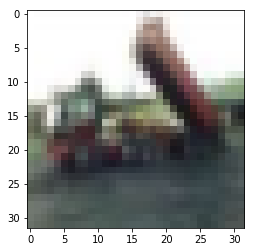

In [3]:
d = unpickle('//code/logs/cifar10_pydata/cifar-10-batches-py/data_batch_1')
data = d['data']
data = data.reshape(10000,3,32,32).transpose(0,2,3,1)
plt.imshow(data[2].astype(np.uint8),vmin=0,vmax=255,aspect='equal', interpolation='none')
plt.show()

In [3]:
#preproccess data
VGG_MEAN = [103.939, 116.779, 123.68]
with tf.Session() as sess:
    images = tf.placeholder(tf.float32,(None,32,32,3))
    predata = tf.image.resize_images(images,tf.constant((224,224)))
    red, green, blue = tf.split(axis=3, num_or_size_splits=3, value=predata)
    assert red.get_shape().as_list()[:] == [None,224, 224, 1]
    assert green.get_shape().as_list()[:] == [None,224, 224, 1]
    assert blue.get_shape().as_list()[:] == [None,224, 224, 1]
    bgr = tf.concat(axis=3, values=[
        blue - VGG_MEAN[0],
        green - VGG_MEAN[1],
        red - VGG_MEAN[2],
    ])
    
    vgg = VGG16base.Vgg16('//code/vgg16.npy')
    vgg.build(bgr)
    
    sess.run(tf.global_variables_initializer())
    
    feats = []
    for f in range(1,6):
        data = unpickle('//code/logs/cifar10_pydata/cifar-10-batches-py/data_batch_' + str(f))['data']
        data = data.reshape(10000,3,32,32).transpose(0,2,3,1)
        for i in range(100):
            if len(feats)==0:
                feats = np.reshape(sess.run(vgg.fc8, feed_dict={images:data[100*i:100*(i+1)]}),(100,-1))
            else:
                feats = np.vstack([feats,np.reshape(sess.run(vgg.fc8, feed_dict={images:data[100*i:100*(i+1)]}),(100,-1))])

build model started
Tensor("pool5:0", shape=(?, 7, 7, 512), dtype=float32)
build model finished: 0s


In [4]:
with open('//code/logs/cifarVGGfc8trainfeats.pkl','wb') as f:
    pickle.dump(feats,f)

### TSNE visualisation

In [4]:
with open('//code/logs/tsned_cifar_train_fc8.pkl','rb') as f:
    tsned = pickle.load(f)

In [5]:
cconv=np.array(['r','g','b','y','orange','black','w','grey','brown','pink'])

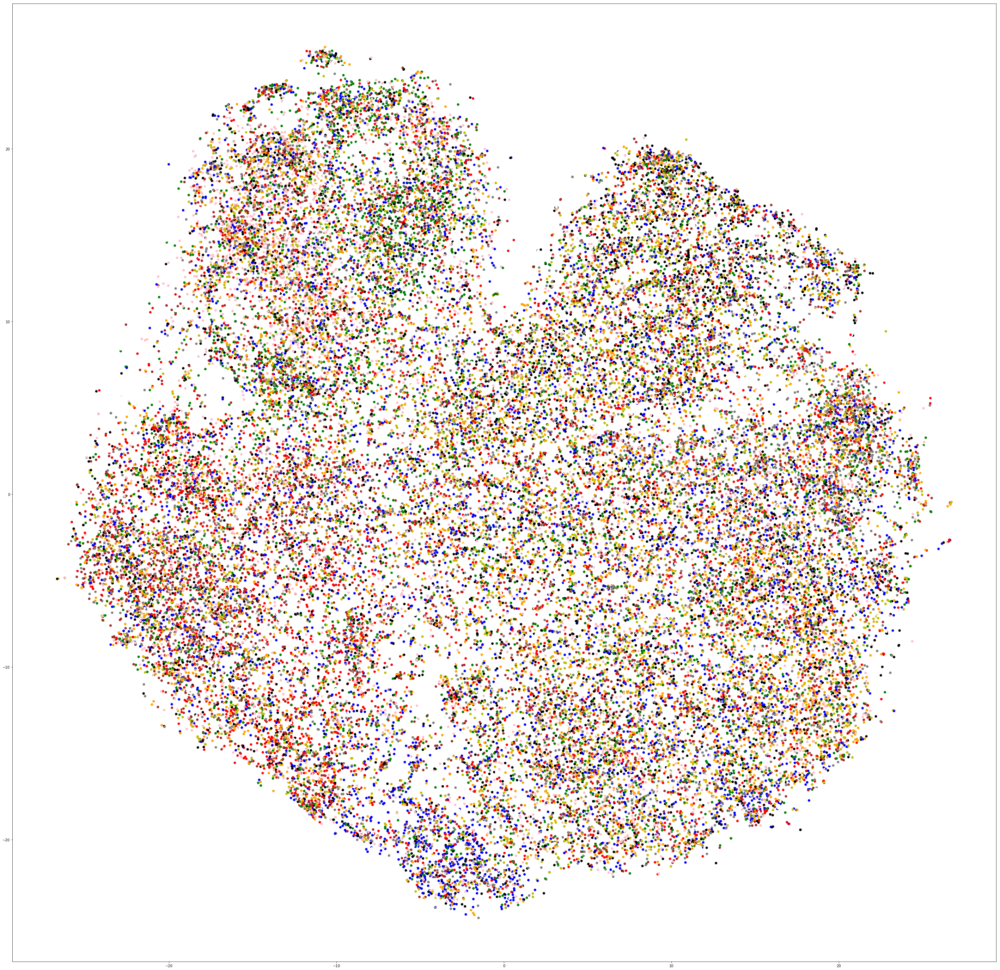

In [6]:
plt.figure(figsize=[50,50])
plt.scatter(tsned[:,0],tsned[:,1],c=cconv[np.array(d['labels'])])

In [ ]:
d.keys()

In [10]:
with open('//code/logs/cifarVGGfc7trainfeats.pkl','rb') as f:
    feats = pickle.load(f)

In [11]:
pca = PCA(n_components=2)
pcaFeats = pca.fit_transform(feats)

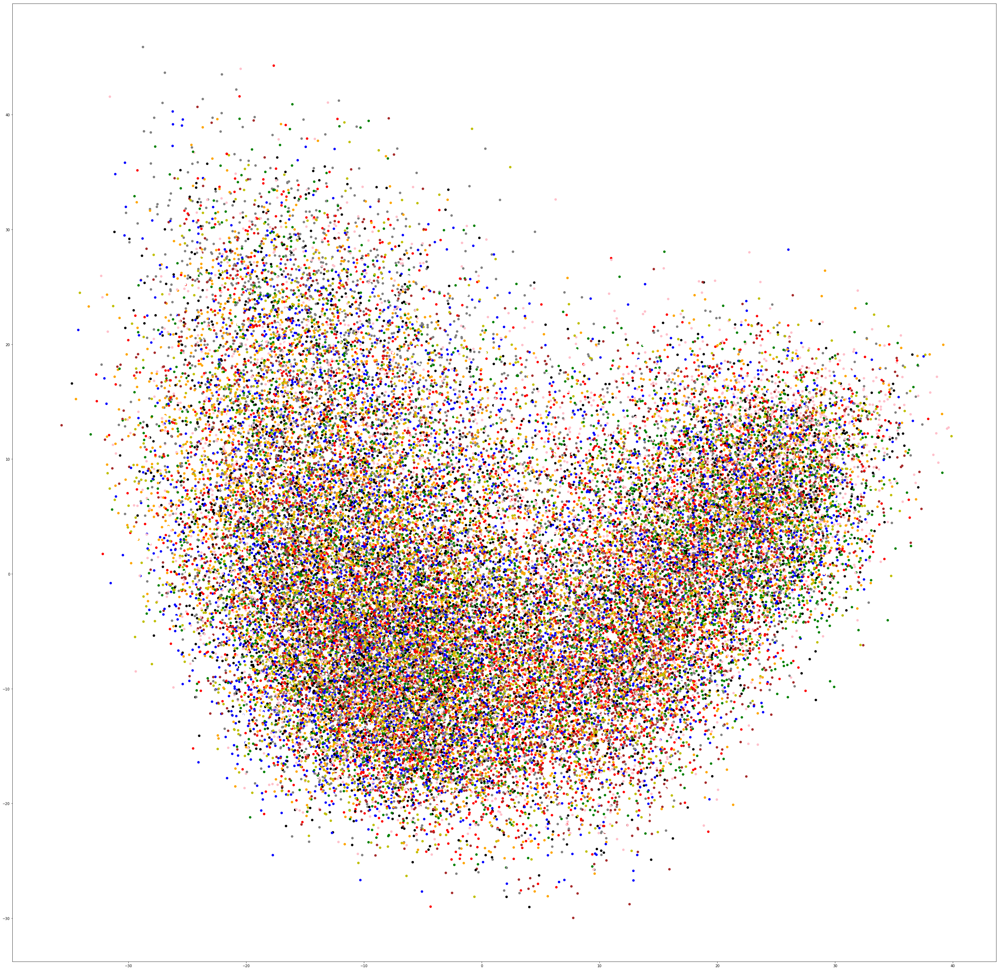

In [12]:
plt.figure(figsize=[50,50])
plt.scatter(pcaFeats[:,0],pcaFeats[:,1],c=cconv[np.array(d['labels'])])